In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import re
import string
import matplotlib.pyplot as plt
import matplotlib_venn as venn
import seaborn as sns


from tqdm import tqdm
import spacy
import random
from spacy.util import compounding
from spacy.util import minibatch
from collections import defaultdict
from collections import  Counter


# sklearn 
from sklearn import preprocessing
from sklearn import model_selection
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer

#nltk
from nltk.corpus import stopwords
from nltk.util import ngrams
stop=set(stopwords.words('english'))
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

#Avoid warning messages
import warnings
warnings.filterwarnings("ignore")

#plotly libraries
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')


from numba import jit, cuda 
import tensorflow as tf
import tensorflow.keras.backend as K
from sklearn.model_selection import StratifiedKFold
from transformers import *
import tokenizers
print('TF version',tf.__version__)

from datetime import datetime as dt

TF version 2.1.0


In [2]:
def jaccard(str1, str2): 
    a = set(str1.lower().split()) 
    b = set(str2.lower().split())
    c = a.intersection(b)
    return float(len(c)) / (len(a) + len(b) - len(c))

# First set of sentences
Actual_1 = 'My life is totally awesome'
Predict_1 = 'awesome life'

# Second set of sentences
Actual_2 = 'We are active kagglers'
Predict_2 = 'We are active kagglers'
    
print("Jaccard score for first set of scentences: {}".format(jaccard(Actual_1,Predict_1)))
print("Jaccard score for second set of scentences: {}".format(jaccard(Actual_2,Predict_2)))

Jaccard score for first set of scentences: 0.4
Jaccard score for second set of scentences: 1.0


In [3]:
train=pd.read_csv(r'C:\Users\erica\Downloads\train.csv.zip')
test=pd.read_csv(r'C:\Users\erica\Downloads\test.csv')
train.sample(6)

,textID,text,selected_text,sentiment
25174,10dccecb22,"You, the other crew and COB tried your hardes...","You, the other crew and COB tried your hardest...",neutral
7937,0ae6313c6a,this is my movie weekend!! i`ve watched 5 movi...,this is my movie weekend!! i`ve watched 5 movi...,neutral
25856,fcd2db766a,My lil` old Mac did the same thing...and it w...,it was never to charge again.,negative
13827,3ce9c6a6f8,"LAPPYTOP BATERRRY DYING,tryingtofind a movieto...","LAPPYTOP BATERRRY DYING,t",negative
13926,e4a6ff8066,No I haven`t had chance to watch that yet...g...,Thanks for the tip,positive
23356,8f6d00e076,"I miss ya, Boyfriend! When am I gonna see ya ...",miss,negative


In [4]:
print("There are {} rows and {} columns in train file".format(train.shape[0],train.shape[1]))
print("There are {} rows and {} columns in test file".format(test.shape[0],test.shape[1]))

There are 27481 rows and 4 columns in train file
There are 3534 rows and 3 columns in test file


In [5]:
print("There are {} percentage of test data proportion compared to train data".format(round(test.shape[0]/train.shape[0]*100,2)))

There are 12.86 percentage of test data proportion compared to train data


In [6]:
# Function for missing value
def miss_val(df):
    total=df.isnull().sum()
    return pd.concat([total],axis=1,keys=['Total'])
print("Missing values for train dataset \n")
print(miss_val(train))
print("---------------------------------------------------------------------")
print("Missing values for test dataset \n")
print(miss_val(test))

Missing values for train dataset 

               Total
textID             0
text               1
selected_text      1
sentiment          0
---------------------------------------------------------------------
Missing values for test dataset 

           Total
textID         0
text           0
sentiment      0


In [7]:
#Observations:

#Data proportion between train and test is almost 88% - 12%
#4 object type variables.
#Only one row in train data has null value in text and selected_text columns

In [8]:
train=train.dropna()
train.shape

(27480, 4)

In [9]:
# Convert to lower
train['target']=train['selected_text'].str.lower()

def find_link(string): 
    url = re.findall('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', string)
    return "".join(url)
train['target_url']=train['target'].apply(lambda x: find_link(x))
df=pd.DataFrame(train.loc[train['target_url']!=""]['sentiment'].value_counts()).reset_index()
df.rename(columns={"index": "sentiment", "sentiment": "url_count"})

,sentiment,url_count
0,neutral,345
1,positive,3
2,negative,3


In [10]:
# Function to find punctuation
def find_punct(text):
    line = re.findall(r'[!"\$%&\'()*+,\-.\/:;=#@?\[\\\]^_`{|}~]*', text)
    string="".join(line)
    return list(string)

In [11]:
# New Features with punctuation and punctuation length
train['target_punct']=train['target'].apply(lambda x:find_punct(x))
train['target_punct_len']=train['target'].apply(lambda x:len(find_punct(x)))

In [12]:
punc_df=pd.DataFrame(train,columns=['target_punct','sentiment'])
punc_df=punc_df[punc_df['target_punct'].map(lambda d: len(d)) > 0]
punc_df=punc_df.explode('target_punct')

positive_df=pd.DataFrame(punc_df.loc[punc_df['sentiment']=="positive"]['target_punct'].value_counts()).reset_index().rename(columns={'index': 'punct','target_punct':'pos_punct'})
negative_df=pd.DataFrame(punc_df.loc[punc_df['sentiment']=="negative"]['target_punct'].value_counts()).reset_index().rename(columns={'index': 'punct','target_punct':'neg_punct'})
neutral_df=pd.DataFrame(punc_df.loc[punc_df['sentiment']=="neutral"]['target_punct'].value_counts()).reset_index().rename(columns={'index': 'punct','target_punct':'neut_punct'})

In [13]:
fig = make_subplots(rows=1, cols=3)

fig.append_trace(go.Bar(x=positive_df.punct[:15],y=positive_df.pos_punct[:15],name='Positive',marker_color='green'), row=1, col=1)
fig.append_trace(go.Bar(x=negative_df.punct[:15],y=negative_df.neg_punct[:15],name='Negative',marker_color='red'), row=1, col=2)
fig.append_trace(go.Bar(x=neutral_df.punct[:15],y=neutral_df.neut_punct[:15],name='Neutral',marker_color='orange'), row=1, col=3)

fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_layout(title_text="Selected Text - Sentiment vs Punctuation",title_x=0.5)
fig.show()

In [14]:
def find_star(text):
   # if len(text.split())<1:
    line=re.findall(r'[*]{2,5}',text)
    return len(line)

In [15]:
train['star']=train['target'].apply(lambda x:find_star(x))
train.loc[train['star']!=0]['sentiment'].value_counts().to_frame()

,sentiment
negative,317
neutral,248
positive,50


In [16]:
def find_only_star(text):
    if len(text.split())==1:
        line=re.findall(r'[*]{2,5}',text)
        return len(line)
    else:
        return 0

In [17]:
# grt column value that has only * in its tweet
train['only_star']=train['target'].apply(lambda x:find_only_star(x))
train.loc[train['only_star']==1]['sentiment'].value_counts()

negative    96
Name: sentiment, dtype: int64

In [18]:
train['target']= np.where(train['only_star']==1,"abusive",train['target'])

In [19]:
def find_exclam(text):
   # if len(text.split())<1:
    line=re.findall(r'[!]',text)
    return len(line)

In [20]:
train['exclaim']=train['target'].apply(lambda x:find_exclam(x))
train.loc[train['exclaim']!=0]['sentiment'].value_counts().to_frame()

,sentiment
neutral,2636
positive,1512
negative,810


In [21]:
fig = go.Figure()
fig.add_trace(go.Histogram(
    x=train[train['sentiment']=='positive']['target_punct_len'],
    #histnorm='percent',
    name='Positive', # name used in legend and hover labels
    xbins=dict( # bins used for histogram
        start=1,
        end=20,
        size=1
    ),
    marker_color='green',
    opacity=0.75
))
fig.add_trace(go.Histogram(
    x=train[train['sentiment']=='negative']['target_punct_len'],
   # histnorm='percent',
    name='Negative',
    xbins=dict(
        start=1,
        end=20,
        size=1
    ),
    marker_color='red',
    opacity=0.75
))

fig.add_trace(go.Histogram(
    x=train[train['sentiment']=='neutral']['target_punct_len'],
   # histnorm='percent',
    name='Neutral',
    xbins=dict(
        start=1,
        end=20,
        size=1
    ),
    marker_color='orange',
    opacity=0.75
))
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_layout(
    title_text='Distribution - Selected Text Punctuation length', # title of plot
    xaxis_title_text='Length', # xaxis label
    yaxis_title_text='Count', # yaxis label
    title_x=0.5,
    bargroupgap=0.1 # gap between bars of the same location coordinates
)
fig.show()


In [22]:
def remove_link(string): 
    text = re.sub('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+'," ",string)
    return " ".join(text.split())

In [23]:
def remove_punct(text):
    line = re.sub(r'[!"\$%&\'()*+,\-.\/:;=#@?\[\\\]^_`{|}~]+'," ",text)
    return " ".join(line.split())

In [24]:
train['target']=train['target'].apply(lambda x:remove_link(x))
train['target']=train['target'].apply(lambda x:remove_punct(x))

In [25]:
train['target_tweet_length']=train['target'].str.split().map(lambda x: len(x))
train['target_tweet_length'].describe().to_frame()

,target_tweet_length
count,27480.000000
mean,7.282205
std,7.096309
min,0.000000
25%,1.000000
50%,5.000000
75%,11.000000
max,35.000000


In [26]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=train[train['sentiment']=='positive']['target_tweet_length'],name="Positive",marker_color='green'))
fig.add_trace(go.Histogram(x=train[train['sentiment']=='negative']['target_tweet_length'],name="Negative",marker_color='red'))
fig.add_trace(go.Histogram(x=train[train['sentiment']=='neutral']['target_tweet_length'],name="Neutral",marker_color='orange'))

# Overlay both histograms

fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_layout(
    title_text='Length of each Selected Text tweet', # title of plot
    xaxis_title_text='Length', # xaxis label
    yaxis_title_text='Count', # yaxis label
    title_x=0.5,
    barmode='overlay'
)

# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

In [27]:
train['target_average_word_len']=train['target'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x))
train['target_average_word_len'].describe().to_frame()

,target_average_word_len
count,27479.000000
mean,4.345043
std,1.713436
min,1.000000
25%,3.428571
50%,4.000000
75%,5.000000
max,110.000000


In [28]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=train[train['sentiment']=='positive']['target_average_word_len'], xbins=dict(
        start=1,
        end=30,
        size=1
    ),name="Positive",marker_color='green'))
fig.add_trace(go.Histogram(x=train[train['sentiment']=='negative']['target_average_word_len'], xbins=dict(
        start=1,
        end=30,
        size=1
    ),name="Negative",marker_color='red'))
fig.add_trace(go.Histogram(x=train[train['sentiment']=='neutral']['target_average_word_len'], xbins=dict(
        start=1,
        end=30,
        size=1
    ),name="Neutral",marker_color='orange'))

# Overlay both histograms
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_layout(
    title_text='Target - Average length of Selected Text', # title of plot
    xaxis_title_text='Length', # xaxis label
    yaxis_title_text='Count', # yaxis label
    title_x=0.5,
    barmode='overlay'
)

# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()


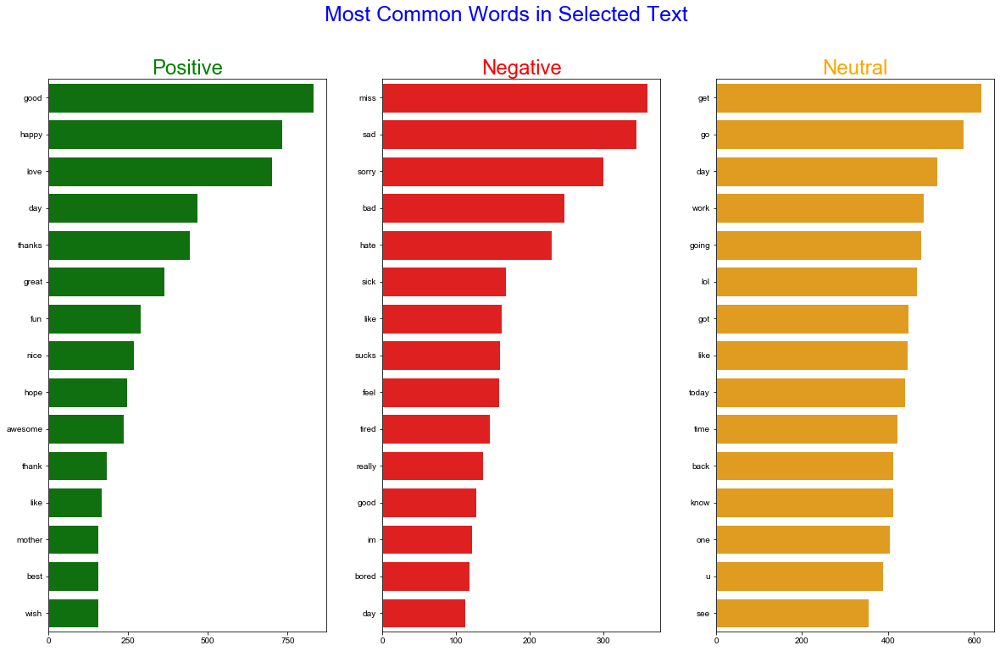

In [29]:
def create_corpus(data,feature,sentiment):
    corpus=[]
    for x in data[data['sentiment']==sentiment][feature].str.split():
        for i in x:
            corpus.append(i)
    return corpus

def corpus_sentiment(data,feature,sentiment):
    corpus=create_corpus(data,feature,sentiment)
    dic=defaultdict(int)
    for word in corpus:
        if word not in stop:
            dic[word]+=1
    top=sorted(dic.items(), key=lambda x:x[1],reverse=True)
    x,y=zip(*top)
    return x,y


f, axes = plt.subplots(1,3,figsize=(20,12))
sns.set(font_scale =2)
sns.barplot(y=list(corpus_sentiment(train,'target','positive')[0])[:15], x= list(corpus_sentiment(train,'target','positive')[1])[:15],color="green",ax=axes[0]).set_title("Positive",color="green")
sns.barplot(y=list(corpus_sentiment(train,'target','negative')[0])[:15], x=list(corpus_sentiment(train,'target','negative')[1])[:15],color="red", ax=axes[1]).set_title("Negative",color="red")
sns.barplot(y=list(corpus_sentiment(train,'target','neutral')[0])[:15], x=list(corpus_sentiment(train,'target','neutral')[1])[:15],color="orange", ax=axes[2]).set_title("Neutral",color="orange")

plt.suptitle("Most Common Words in Selected Text" ,fontsize=25,color="blue")
plt.show() 


In [30]:
# count unique values present in each column
def count_values(df,feature):
    total=df.loc[:,feature].value_counts(dropna=False)
    percent=round(df.loc[:,feature].value_counts(dropna=False,normalize=True)*100,2)
    return pd.concat([total,percent],axis=1,keys=['Total','Percent'])

In [31]:
count_values(train,'sentiment')

,Total,Percent
neutral,11117,40.45
positive,8582,31.23
negative,7781,28.32


In [32]:
sent_train=count_values(train,'sentiment')
sent_test=count_values(test,'sentiment')

colors = ['orange','green','red']

fig = make_subplots(rows=1, cols=2,specs=[[{"type": "pie"}, {"type": "pie"}]])

fig.add_trace(go.Pie(labels=list(sent_train.index), values=list(sent_train.Total.values), hoverinfo='label+percent', 
               textinfo='value+percent',marker=dict(colors=colors)),row=1,col=1)
fig.add_trace(go.Pie(labels=list(sent_test.index), values=list(sent_test.Total.values), hoverinfo='label+percent', 
               textinfo='value+percent', marker=dict(colors=colors)),row=1,col=2)
fig.update_layout( title_text="Sentiment - Train vs Test",title_x=0.5)
iplot(fig)

In [33]:
full_data=pd.concat([train,test])
full_data['text']=full_data['text'].str.lower()
full_data.shape

(31014, 13)

In [34]:
# New Features with punctuation and punctuation length
full_data['text_punct']=full_data['text'].apply(lambda x:find_punct(x))
full_data['text_punct_len']=full_data['text'].apply(lambda x:len(find_punct(x)))

In [35]:
punc_text_df=pd.DataFrame(full_data,columns=['text_punct','sentiment'])
punc_text_df=punc_text_df[punc_text_df['text_punct'].map(lambda d: len(d)) > 0]
punc_text_df=punc_text_df.explode('text_punct')


positive_text_df=pd.DataFrame(punc_text_df.loc[punc_text_df['sentiment']=="positive"]['text_punct'].value_counts()).reset_index().rename(columns={'index': 'punct','text_punct':'pos_punct'})
negative_text_df=pd.DataFrame(punc_text_df.loc[punc_text_df['sentiment']=="negative"]['text_punct'].value_counts()).reset_index().rename(columns={'index': 'punct','text_punct':'neg_punct'})
neutral_text_df=pd.DataFrame(punc_text_df.loc[punc_text_df['sentiment']=="neutral"]['text_punct'].value_counts()).reset_index().rename(columns={'index': 'punct','text_punct':'neut_punct'})
fig = make_subplots(rows=1, cols=3)
fig.append_trace(go.Bar(x=positive_text_df.punct[:15],y=positive_text_df.pos_punct[:10],name='Positive',marker_color='green'), row=1, col=1)
fig.append_trace(go.Bar(x=negative_text_df.punct[:15],y=negative_text_df.neg_punct[:15],name='Negative',marker_color='red'), row=1, col=2)
fig.append_trace(go.Bar(x=neutral_text_df.punct[:15],y=neutral_text_df.neut_punct[:15],name='Neutral',marker_color='orange'), row=1, col=3)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_layout(title_text="Text - Sentiment vs Punctuation",title_x=0.5)
fig.show()

In [36]:
full_data['text']=full_data['text'].apply(lambda x:remove_link(x))
full_data['text']=full_data['text'].apply(lambda x:remove_punct(x))

In [37]:
full_data.loc[full_data['text']=="",['text']]="nothing"

In [38]:
full_data['text_tweet_length']=full_data['text'].str.split().map(lambda x: len(x))
full_data['text_tweet_length'].describe().to_frame()

,text_tweet_length
count,31014.000000
mean,13.206971
std,7.152156
min,1.000000
25%,7.000000
50%,12.000000
75%,19.000000
max,35.000000


In [39]:
fig = go.Figure()
fig.add_trace(go.Box(x=full_data[full_data['sentiment']=='neutral']['text_tweet_length'],name="Neutral",marker_color='orange',boxmean='sd'))
fig.add_trace(go.Box(x=full_data[full_data['sentiment']=='negative']['text_tweet_length'],name="Negative",marker_color='red',boxmean='sd'))
fig.add_trace(go.Box(x=full_data[full_data['sentiment']=='positive']['text_tweet_length'],name="Positive",marker_color='green',boxmean='sd'))

# Overlay both histograms
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_layout(
    title_text='Distribution of Text Length', # title of plot
    xaxis_title_text='Length', # xaxis label
    yaxis_title_text='Count', # yaxis label
    title_x=0.5
)

# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

In [40]:
full_data['text_average_word_len']=full_data['text'].str.split().apply(lambda x : [len(i) for i in x]).map(lambda x: np.mean(x))
full_data['text_average_word_len'].describe().to_frame()

,text_average_word_len
count,31014.000000
mean,3.977850
std,0.858416
min,1.500000
25%,3.473684
50%,3.857143
75%,4.333333
max,27.000000


In [41]:
fig = go.Figure()
fig.add_trace(go.Box(x=full_data[full_data['sentiment']=='positive']['text_average_word_len'],name="Positive",marker_color='green'))
fig.add_trace(go.Box(x=full_data[full_data['sentiment']=='negative']['text_average_word_len'],name="Negative",marker_color='red'))
fig.add_trace(go.Box(x=full_data[full_data['sentiment']=='neutral']['text_average_word_len'],name="Neutral",marker_color='orange'))

# Overlay both histograms
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_layout(
    title_text='Average Length of Tweet', # title of plot
    xaxis_title_text='Length', # xaxis label
    yaxis_title_text='Count', # yaxis label
    title_x=0.5,
)

# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

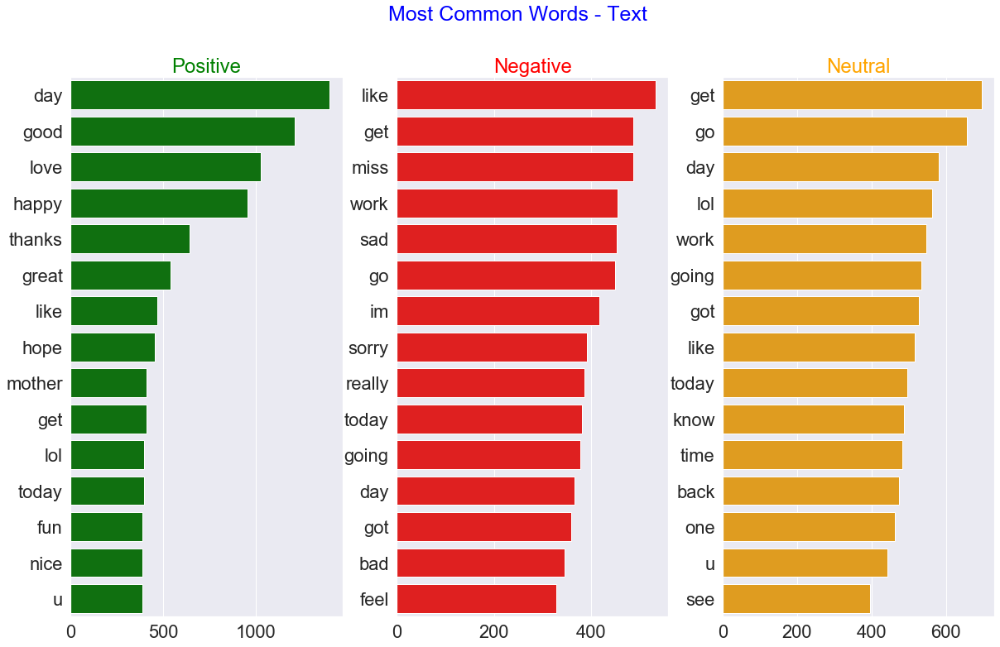

In [42]:
f, axes = plt.subplots(1,3,figsize=(20,12))
sns.set(font_scale=2)
sns.barplot(y=list(corpus_sentiment(full_data,'text','positive')[0])[:15], x= list(corpus_sentiment(full_data,'text','positive')[1])[:15],color="green",ax=axes[0]).set_title("Positive",color="green")
sns.barplot(y=list(corpus_sentiment(full_data,'text','negative')[0])[:15], x=list(corpus_sentiment(full_data,'text','negative')[1])[:15],color="red", ax=axes[1]).set_title("Negative",color="red")
sns.barplot(y=list(corpus_sentiment(full_data,'text','neutral')[0])[:15], x=list(corpus_sentiment(full_data,'text','neutral')[1])[:15],color="orange", ax=axes[2]).set_title("Neutral",color="orange")

plt.suptitle("Most Common Words - Text" ,fontsize=25,color="blue")
plt.show()

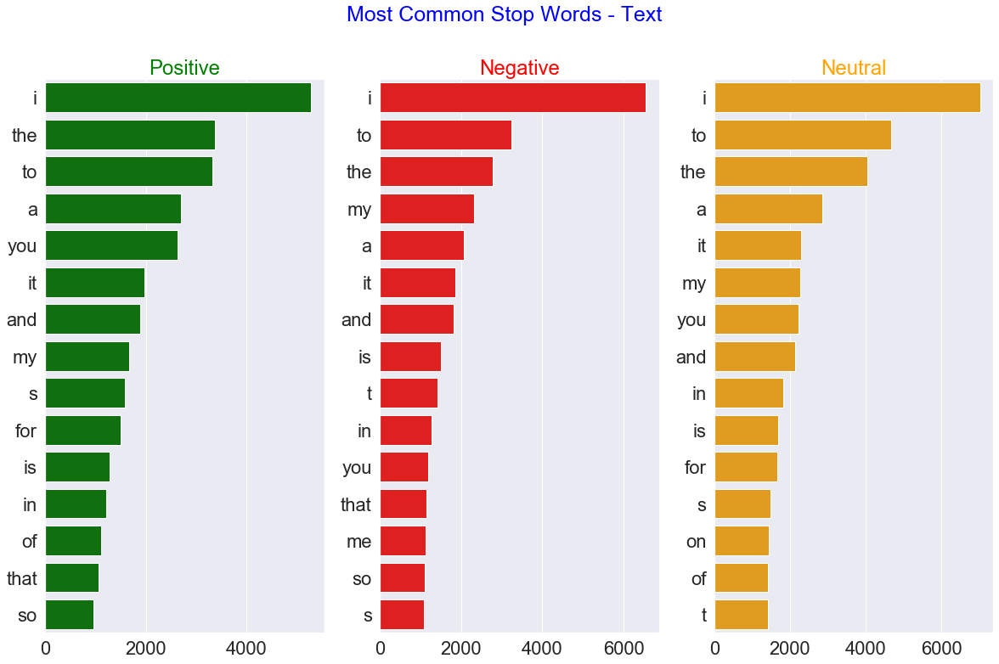

In [43]:
def corpus_sentiment_stop(data,feature,sentiment):
    corpus=create_corpus(data,feature,sentiment)
    dic=defaultdict(int)
    for word in corpus:
        if word in stop:
            dic[word]+=1
    top=sorted(dic.items(), key=lambda x:x[1],reverse=True)
    x,y=zip(*top)
    return x,y

f, axes = plt.subplots(1,3,figsize=(20,12))
sns.set(font_scale =2)
sns.barplot(y=list(corpus_sentiment_stop(full_data,'text','positive')[0])[:15], x= list(corpus_sentiment_stop(full_data,'text','positive')[1])[:15],color="green",ax=axes[0]).set_title("Positive",color="green")
sns.barplot(y=list(corpus_sentiment_stop(full_data,'text','negative')[0])[:15], x=list(corpus_sentiment_stop(full_data,'text','negative')[1])[:15],color="red", ax=axes[1]).set_title("Negative",color="red")
sns.barplot(y=list(corpus_sentiment_stop(full_data,'text','neutral')[0])[:15], x=list(corpus_sentiment_stop(full_data,'text','neutral')[1])[:15],color="orange", ax=axes[2]).set_title("Neutral",color="orange")

plt.suptitle("Most Common Stop Words - Text" ,fontsize=25,color="blue")
plt.show()

In [44]:
#comparison

In [45]:
train_word=full_data[:train.shape[0]]
test_word=full_data[train.shape[0]:]

In [46]:
def ngrams_plot(corpus,ngram_range,n=None):
    """
    List the top n words in a vocabulary according to occurrence in a text corpus.
    """
    vec = CountVectorizer(stop_words = 'english',ngram_range=ngram_range).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    total_list=words_freq[:n]
    df=pd.DataFrame(total_list,columns=['text','count'])
    return df


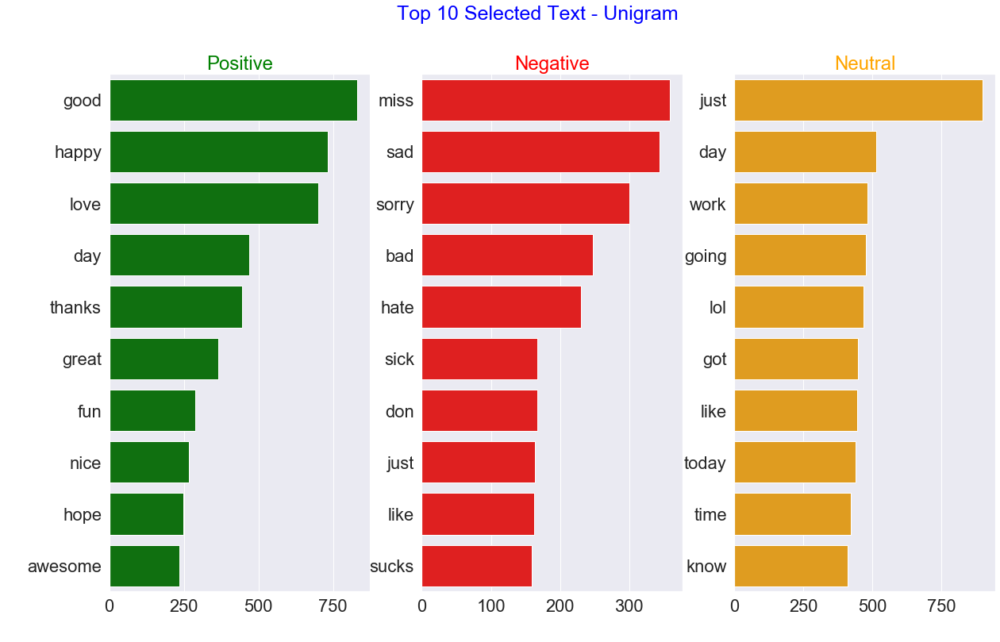

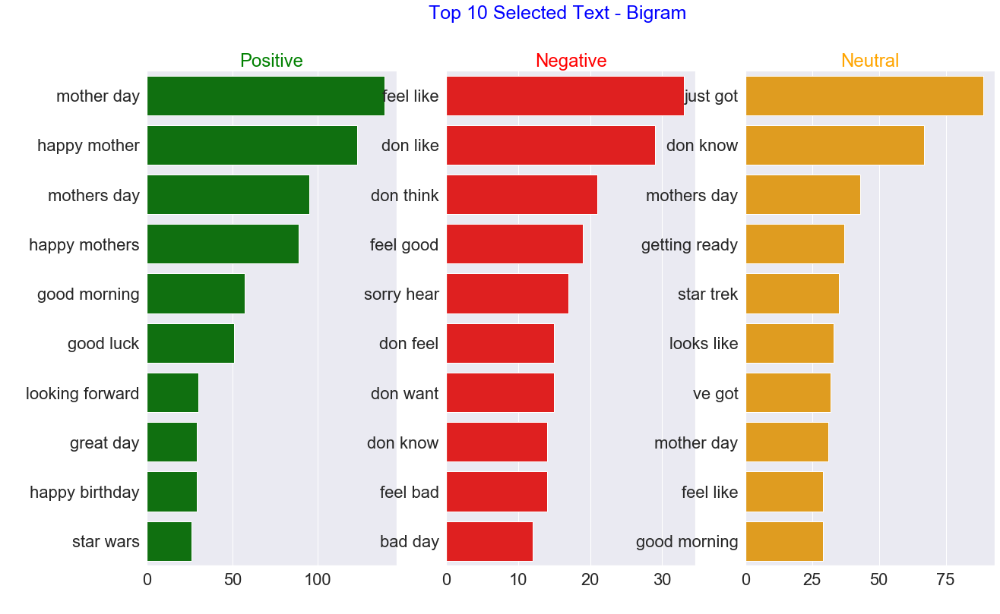

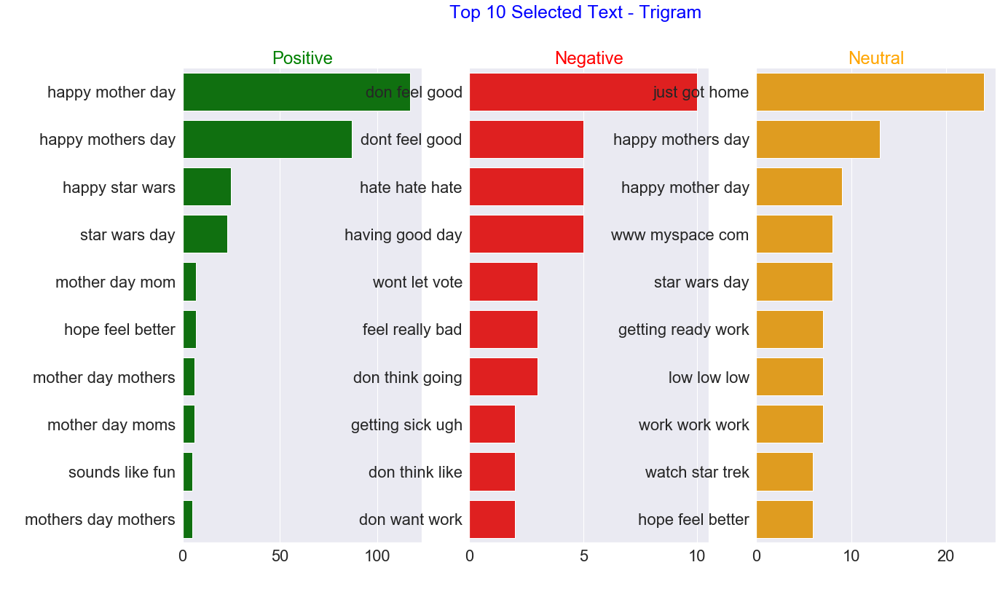

In [47]:
f, axes = plt.subplots(1,3,figsize=(20,12))
sns.set(font_scale =2)
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='positive']['target'],(1,1),10)['text'],
            x= ngrams_plot(train_word.loc[train_word['sentiment']=='positive']['target'],(1,1),10)['count'],
            color="green",ax=axes[0]).set_title("Positive",color="green")
axes[0].set(ylabel=" ",xlabel=" ")
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='negative']['target'],(1,1),10)['text'],
            x=ngrams_plot(train_word.loc[train_word['sentiment']=='negative']['target'],(1,1),10)['count'],
            color="red", ax=axes[1]).set_title("Negative",color="red")
axes[1].set(ylabel=" ",xlabel=" ")
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='neutral']['target'],(1,1),10)['text'], 
            x=ngrams_plot(train_word.loc[train_word['sentiment']=='neutral']['target'],(1,1),10)['count'],
            color="orange", ax=axes[2]).set_title("Neutral",color="orange")
axes[2].set(ylabel=" ",xlabel=" ")
f.suptitle("Top 10 Selected Text - Unigram" ,fontsize=25,color="blue")
f.show() 

f, axes = plt.subplots(1,3,figsize=(20,12))
sns.set(font_scale =2)
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='positive']['target'],(2,2),10)['text'],
            x= ngrams_plot(train_word.loc[train_word['sentiment']=='positive']['target'],(2,2),10)['count'],
            color="green",ax=axes[0]).set_title("Positive",color="green")
axes[0].set(ylabel=" ",xlabel=" ")
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='negative']['target'],(2,2),10)['text'],
            x=ngrams_plot(train_word.loc[train_word['sentiment']=='negative']['target'],(2,2),10)['count'],
            color="red", ax=axes[1]).set_title("Negative",color="red")
axes[1].set(ylabel=" ",xlabel=" ")
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='neutral']['target'],(2,2),10)['text'], 
            x=ngrams_plot(train_word.loc[train_word['sentiment']=='neutral']['target'],(2,2),10)['count'],
            color="orange", ax=axes[2]).set_title("Neutral",color="orange")
axes[2].set(ylabel=" ",xlabel=" ")
f.suptitle("Top 10 Selected Text - Bigram" ,fontsize=25,color="blue")
f.show() 

f, axes = plt.subplots(1,3,figsize=(20,12))
sns.set(font_scale =2)
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='positive']['target'],(3,3),10)['text'],
            x= ngrams_plot(train_word.loc[train_word['sentiment']=='positive']['target'],(3,3),10)['count'],
            color="green",ax=axes[0]).set_title("Positive",color="green")
axes[0].set(ylabel=" ",xlabel=" ")
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='negative']['target'],(3,3),10)['text'],
            x=ngrams_plot(train_word.loc[train_word['sentiment']=='negative']['target'],(3,3),10)['count'],
            color="red", ax=axes[1]).set_title("Negative",color="red")
axes[1].set(ylabel=" ",xlabel=" ")
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='neutral']['target'],(3,3),10)['text'], 
            x=ngrams_plot(train_word.loc[train_word['sentiment']=='neutral']['target'],(3,3),10)['count'],
            color="orange", ax=axes[2]).set_title("Neutral",color="orange")
axes[2].set(ylabel=" ",xlabel=" ")
f.suptitle("Top 10 Selected Text - Trigram" ,fontsize=25,color="blue")
f.show() 

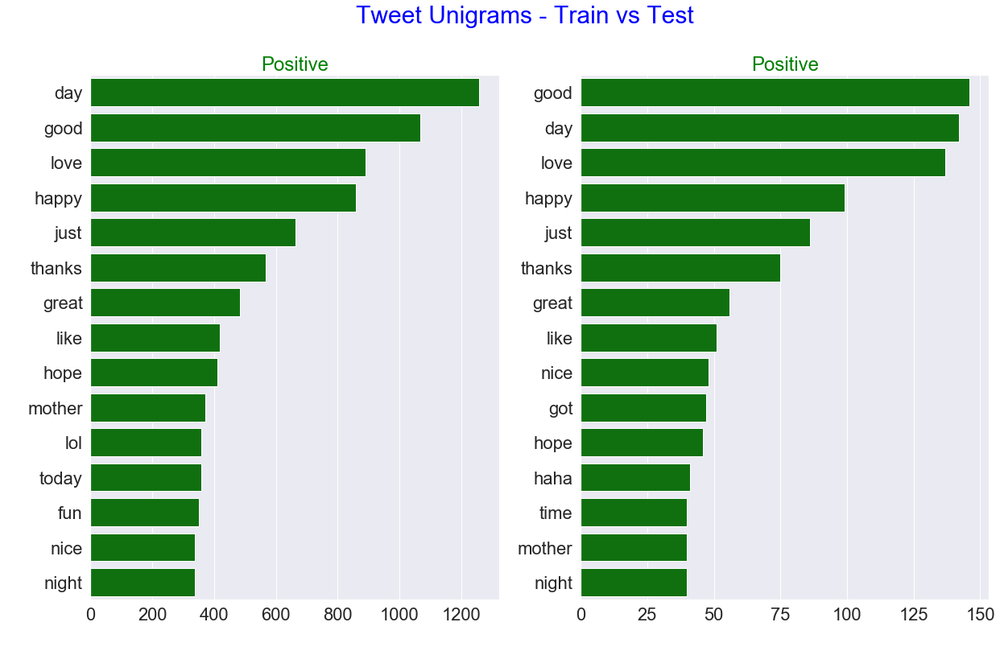

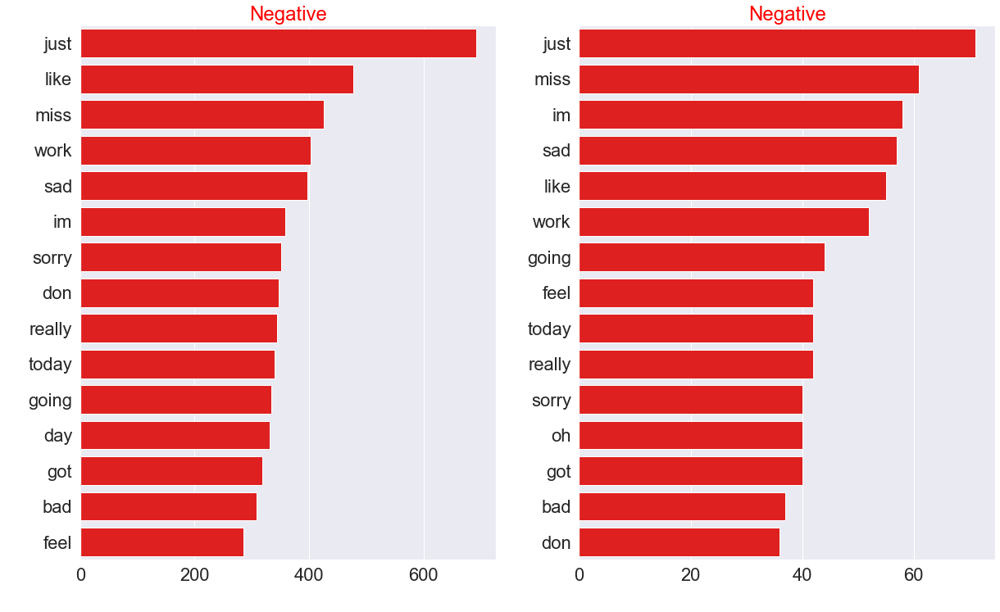

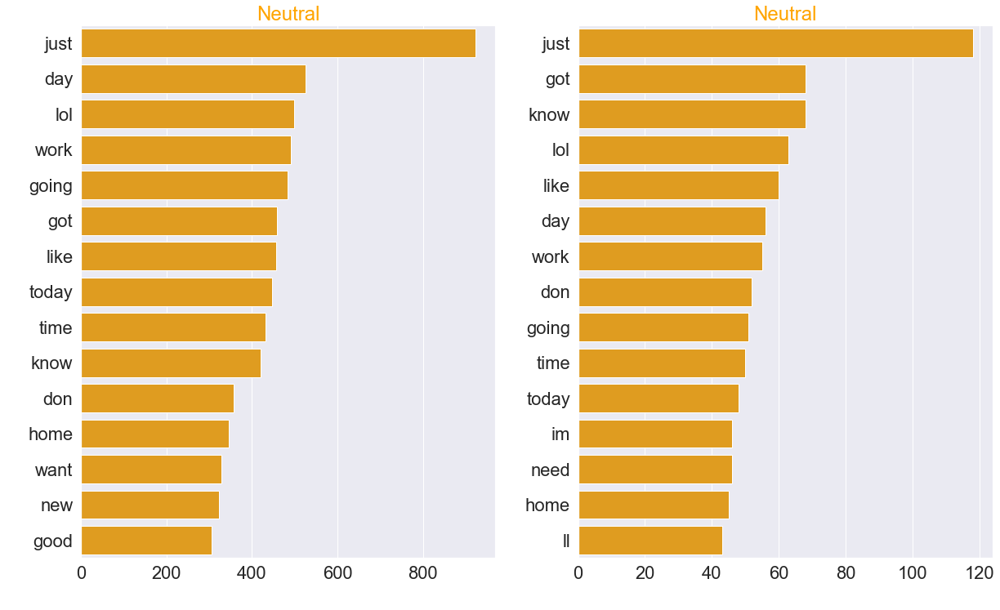

In [48]:
f, axes = plt.subplots(1,2,figsize=(20,12))
sns.set(font_scale =2)
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='positive']['text'],(1,1),15)['text'],
            x= ngrams_plot(train_word.loc[train_word['sentiment']=='positive']['text'],(1,1),15)['count'],
            color="green",ax=axes[0]).set_title("Positive",color="green")
axes[0].set(ylabel=" ",xlabel=" ")
f.suptitle("Tweet Unigrams - Train vs Test" ,fontsize=30,color="blue")
sns.barplot(y=ngrams_plot(test_word.loc[test_word['sentiment']=='positive']['text'],(1,1),15)['text'],
            x=ngrams_plot(test_word.loc[test_word['sentiment']=='positive']['text'],(1,1),15)['count'],
            color="green", ax=axes[1]).set_title("Positive",color="green")
axes[1].set(ylabel=" ",xlabel=" ")
f.show() 

f, axes = plt.subplots(1,2,figsize=(20,12))
sns.set(font_scale =2)
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='negative']['text'],(1,1),15)['text'],
            x= ngrams_plot(train_word.loc[train_word['sentiment']=='negative']['text'],(1,1),15)['count'],
            color="red",ax=axes[0]).set_title("Negative",color="red")
axes[0].set(ylabel=" ",xlabel=" ")
sns.barplot(y=ngrams_plot(test_word.loc[test_word['sentiment']=='negative']['text'],(1,1),15)['text'],
            x=ngrams_plot(test_word.loc[test_word['sentiment']=='negative']['text'],(1,1),15)['count'],
            color="red", ax=axes[1]).set_title("Negative",color="red")
axes[1].set(ylabel=" ",xlabel=" ")
f.show() 

f, axes = plt.subplots(1,2,figsize=(20,12))
sns.set(font_scale =2)
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='neutral']['text'],(1,1),15)['text'],
            x= ngrams_plot(train_word.loc[train_word['sentiment']=='neutral']['text'],(1,1),15)['count'],
            color="orange",ax=axes[0]).set_title("Neutral",color="orange")
axes[0].set(ylabel=" ",xlabel=" ")
sns.barplot(y=ngrams_plot(test_word.loc[test_word['sentiment']=='neutral']['text'],(1,1),15)['text'],
            x=ngrams_plot(test_word.loc[test_word['sentiment']=='neutral']['text'],(1,1),15)['count'],
            color="orange", ax=axes[1]).set_title("Neutral",color="orange")
axes[1].set(ylabel=" ",xlabel=" ")
f.show()

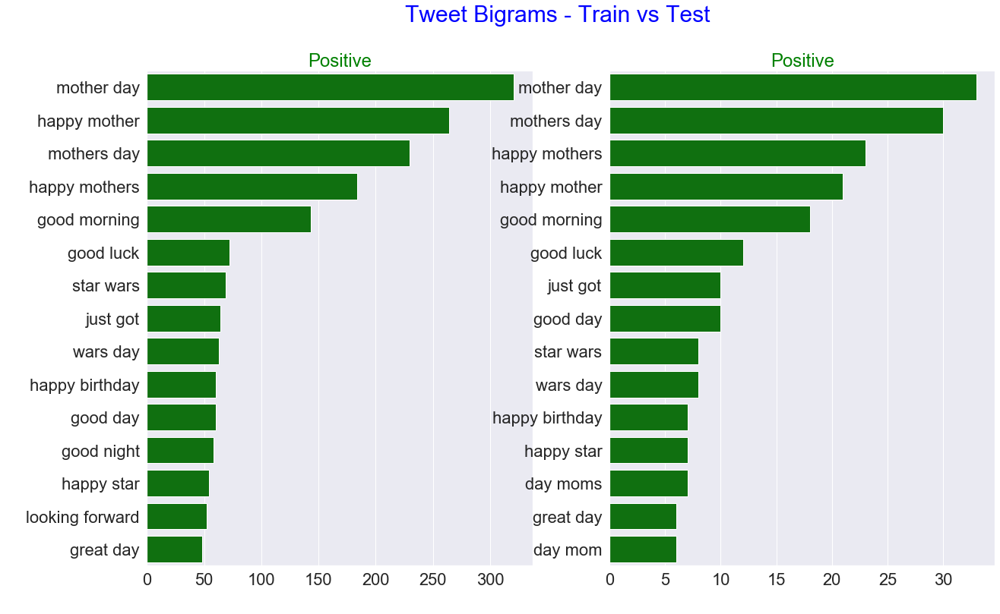

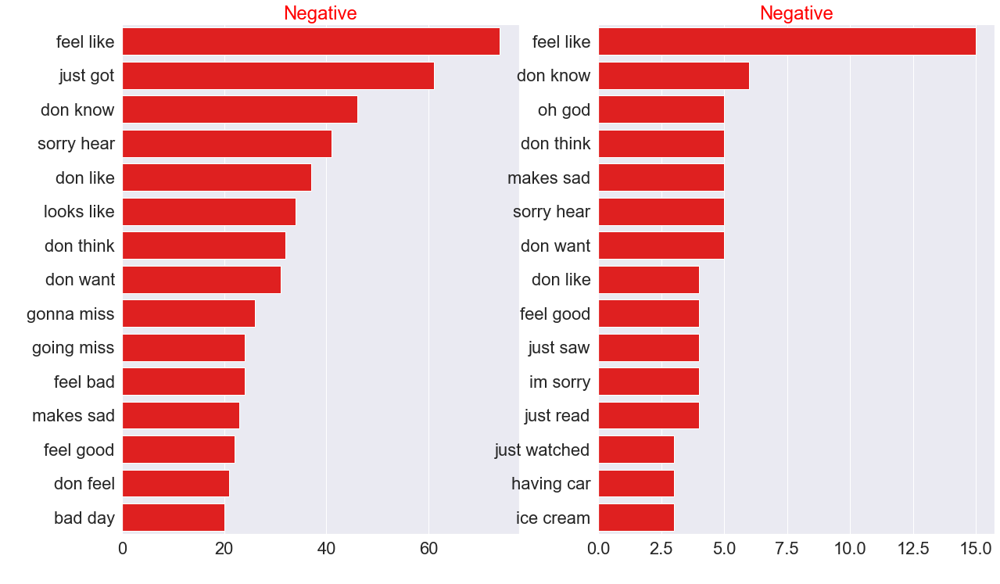

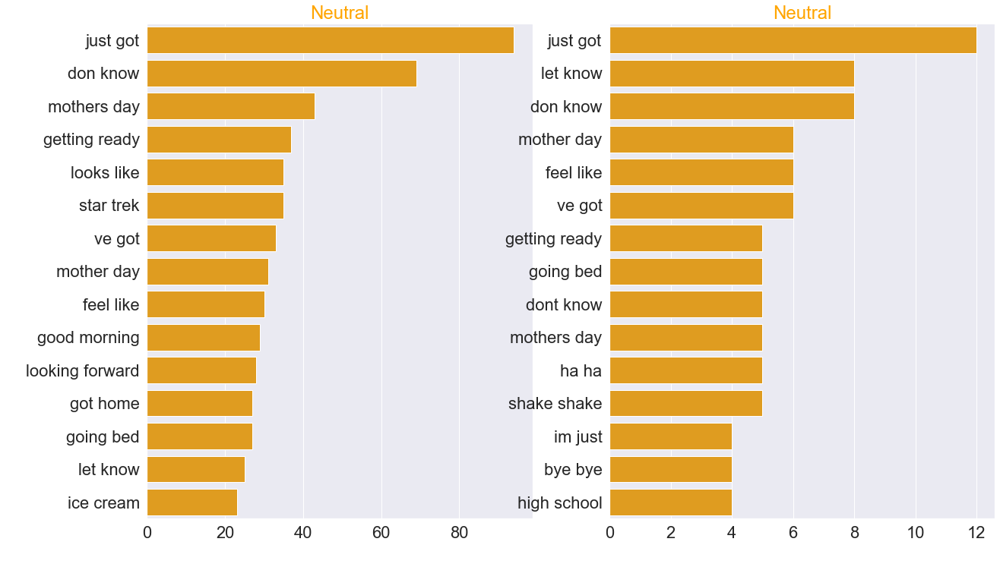

In [49]:
f, axes = plt.subplots(1,2,figsize=(20,12))
sns.set(font_scale =2)
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='positive']['text'],(2,2),15)['text'],
            x= ngrams_plot(train_word.loc[train_word['sentiment']=='positive']['text'],(2,2),15)['count'],
            color="green",ax=axes[0]).set_title("Positive",color="green")
axes[0].set(ylabel=" ",xlabel=" ")
f.suptitle("Tweet Bigrams - Train vs Test" ,fontsize=30,color="blue")
sns.barplot(y=ngrams_plot(test_word.loc[test_word['sentiment']=='positive']['text'],(2,2),15)['text'],
            x=ngrams_plot(test_word.loc[test_word['sentiment']=='positive']['text'],(2,2),15)['count'],
            color="green", ax=axes[1]).set_title("Positive",color="green")
axes[1].set(ylabel=" ",xlabel=" ")
f.show() 

f, axes = plt.subplots(1,2,figsize=(20,12))
sns.set(font_scale =2)
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='negative']['text'],(2,2),15)['text'],
            x= ngrams_plot(train_word.loc[train_word['sentiment']=='negative']['text'],(2,2),15)['count'],
            color="red",ax=axes[0]).set_title("Negative",color="red")
axes[0].set(ylabel=" ",xlabel=" ")
sns.barplot(y=ngrams_plot(test_word.loc[test_word['sentiment']=='negative']['text'],(2,2),15)['text'],
            x=ngrams_plot(test_word.loc[test_word['sentiment']=='negative']['text'],(2,2),15)['count'],
            color="red", ax=axes[1]).set_title("Negative",color="red")
axes[1].set(ylabel=" ",xlabel=" ")
f.show() 

f, axes = plt.subplots(1,2,figsize=(20,12))
sns.set(font_scale =2)
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='neutral']['text'],(2,2),15)['text'],
            x= ngrams_plot(train_word.loc[train_word['sentiment']=='neutral']['text'],(2,2),15)['count'],
            color="orange",ax=axes[0]).set_title("Neutral",color="orange")
axes[0].set(ylabel=" ",xlabel=" ")
sns.barplot(y=ngrams_plot(test_word.loc[test_word['sentiment']=='neutral']['text'],(2,2),15)['text'],
            x=ngrams_plot(test_word.loc[test_word['sentiment']=='neutral']['text'],(2,2),15)['count'],
            color="orange", ax=axes[1]).set_title("Neutral",color="orange")
axes[1].set(ylabel=" ",xlabel=" ")
f.show() 

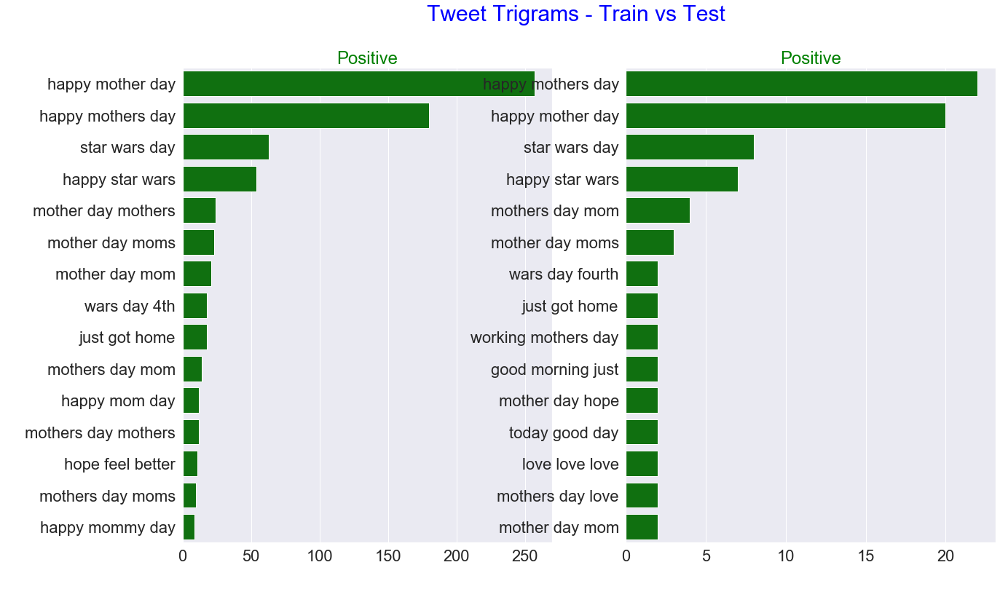

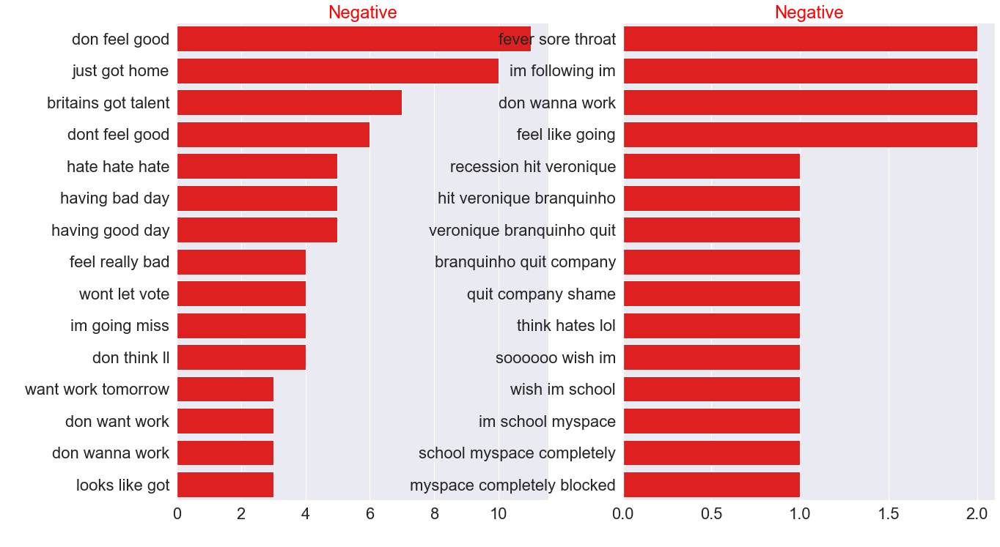

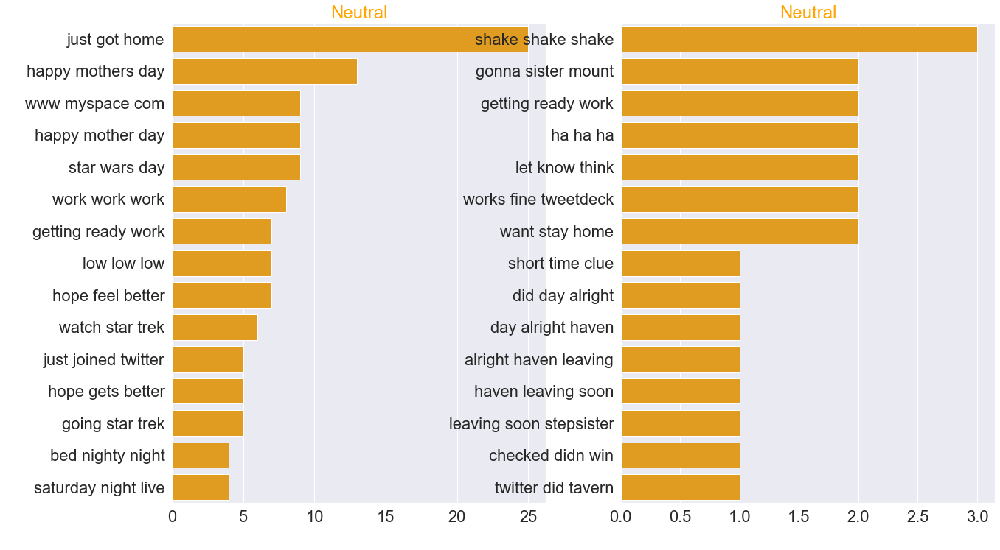

In [50]:
f, axes = plt.subplots(1,2,figsize=(20,12))
sns.set(font_scale =2)
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='positive']['text'],(3,3),15)['text'],
            x= ngrams_plot(train_word.loc[train_word['sentiment']=='positive']['text'],(3,3),15)['count'],
            color="green",ax=axes[0]).set_title("Positive",color="green")
axes[0].set(ylabel=" ",xlabel=" ")
f.suptitle("Tweet Trigrams - Train vs Test" ,fontsize=30,color="blue")
sns.barplot(y=ngrams_plot(test_word.loc[test_word['sentiment']=='positive']['text'],(3,3),15)['text'],
            x=ngrams_plot(test_word.loc[test_word['sentiment']=='positive']['text'],(3,3),15)['count'],
            color="green", ax=axes[1]).set_title("Positive",color="green")
axes[1].set(ylabel=" ",xlabel=" ")
f.show() 

f, axes = plt.subplots(1,2,figsize=(20,12))
sns.set(font_scale =2)
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='negative']['text'],(3,3),15)['text'],
            x= ngrams_plot(train_word.loc[train_word['sentiment']=='negative']['text'],(3,3),15)['count'],
            color="red",ax=axes[0]).set_title("Negative",color="red")
axes[0].set(ylabel=" ",xlabel=" ")
sns.barplot(y=ngrams_plot(test_word.loc[test_word['sentiment']=='negative']['text'],(3,3),15)['text'],
            x=ngrams_plot(test_word.loc[test_word['sentiment']=='negative']['text'],(3,3),15)['count'],
            color="red", ax=axes[1]).set_title("Negative",color="red")
axes[1].set(ylabel=" ",xlabel=" ")
f.show() 

f, axes = plt.subplots(1,2,figsize=(20,12))
sns.set(font_scale =2)
sns.barplot(y=ngrams_plot(train_word.loc[train_word['sentiment']=='neutral']['text'],(3,3),15)['text'],
            x= ngrams_plot(train_word.loc[train_word['sentiment']=='neutral']['text'],(3,3),15)['count'],
            color="orange",ax=axes[0]).set_title("Neutral",color="orange")
axes[0].set(ylabel=" ",xlabel=" ")
sns.barplot(y=ngrams_plot(test_word.loc[test_word['sentiment']=='neutral']['text'],(3,3),15)['text'],
            x=ngrams_plot(test_word.loc[test_word['sentiment']=='neutral']['text'],(3,3),15)['count'],
            color="orange", ax=axes[1]).set_title("Neutral",color="orange")
axes[1].set(ylabel=" ",xlabel=" ")
f.show() 

In [51]:
pos_text_list=list(corpus_sentiment(train_word,'text','positive')[0])
pos_target_list=list(corpus_sentiment(train_word,'target','positive')[0])
neg_text_list=list(corpus_sentiment(train_word,'text','negative')[0])
neg_target_list=list(corpus_sentiment(train_word,'target','negative')[0])
neutral_text_list=list(corpus_sentiment(train_word,'text','neutral')[0])
neutral_target_list=list(corpus_sentiment(train_word,'target','neutral')[0])

pos_common_words_list=list(set(pos_text_list).intersection(pos_target_list))
neg_common_words_list=list(set(neg_text_list).intersection(neg_target_list))
neutral_common_words_list=list(set(neutral_text_list).intersection(neutral_target_list))


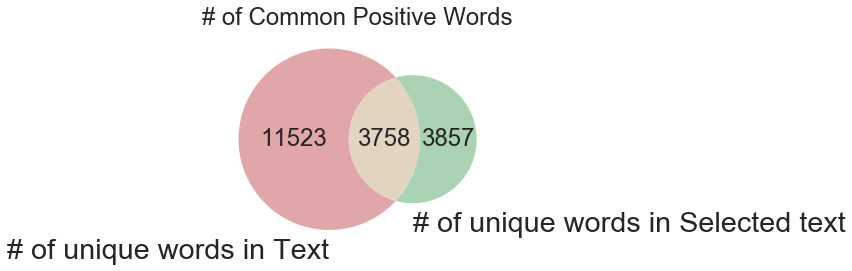

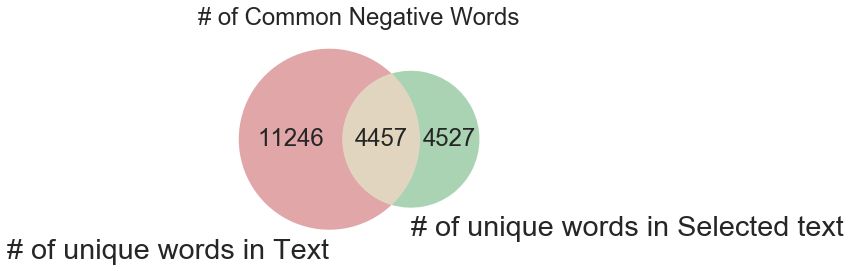

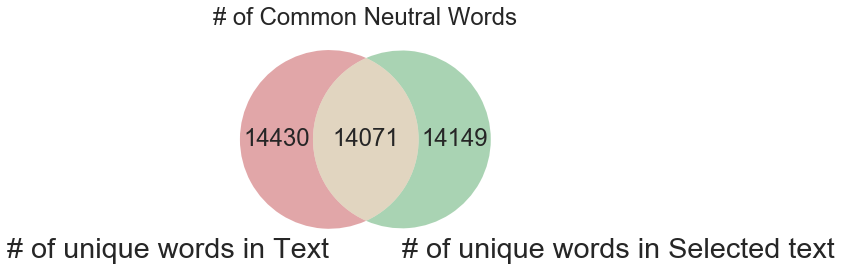

In [52]:
def venn_plot(x,y,common_list,title):
    plt.title(title)
    venn.venn2(subsets=(x,y,common_list), alpha = 0.5,set_labels=("# of unique words in Text","# of unique words in Selected text"))
    return plt.show()

venn_plot(len(pos_text_list),len(pos_target_list),len(pos_common_words_list),"# of Common Positive Words")
venn_plot(len(neg_text_list),len(neg_target_list),len(neg_common_words_list),"# of Common Negative Words")
venn_plot(len(neutral_text_list),len(neutral_target_list),len(neutral_common_words_list),"# of Common Neutral Words")


In [53]:
results_jaccard=[]

for ind,row in train_word.iterrows():
    sentence1 = row.text
    sentence2 = row.target

    jaccard_score = jaccard(sentence1,sentence2) # Jaccard function is defined at top of kernel
    results_jaccard.append([sentence1,sentence2,jaccard_score])

jaccard = pd.DataFrame(results_jaccard,columns=["text","target","jaccard_score"])
train_word = train_word.merge(jaccard,how='outer')

train_word['jaccard_score'].describe().to_frame()

,jaccard_score
count,28372.000000
mean,0.608202
std,0.408825
min,0.000000
25%,0.157895
50%,0.818182
75%,1.000000
max,1.000000


In [54]:
x = train_word['text_tweet_length']
y = train_word['jaccard_score']
fig = go.Figure()
fig.add_trace(go.Histogram2dContour(
        x = x,
        y = y,
        colorscale = 'gray',
        reversescale = True,
        xaxis = 'x',
        yaxis = 'y'
    ))
fig.add_trace(go.Scatter(
        x = x,
        y = y,
        xaxis = 'x',
        yaxis = 'y',
        mode = 'markers',
        marker = dict(
            color = 'blue',  #'rgba(0,0,0,0.3)',
            size = 3
        )
    ))
fig.add_trace(go.Histogram(
        y = y,
        xaxis = 'x2',
        marker = dict(
            color = 'rgba(0,0,0,1)'
        )
    ))
fig.add_trace(go.Histogram(
        x = x,
        yaxis = 'y2',
        marker = dict(
            color = 'rgba(0,0,0,1)'
        )
    ))

fig.update_layout(
    autosize = False,
    xaxis = dict(
        zeroline = False,
        domain = [0,0.85],
        showgrid = False
    ),
    yaxis = dict(
        zeroline = False,
        domain = [0,0.85],
        showgrid = False
    ),
    xaxis2 = dict(
        zeroline = False,
        domain = [0.85,1],
        showgrid = False
    ),
    yaxis2 = dict(
        zeroline = False,
        domain = [0.85,1],
        showgrid = False
    ),
    height = 600,
    width = 600,
    bargap = 0,
    hovermode = 'closest',
    showlegend = False,
    title_text="Jaccard - Text vs Selected Text ",title_x=0.5
)

fig.show()

In [55]:
print("Jaccard score equals 1 : {}%".format(round(train_word.loc[train_word['jaccard_score']==1].shape[0]/train_word.shape[0]*100,2)))
print("Jaccard score less than 0.3 : {}%".format(round(train_word.loc[train_word['jaccard_score']<0.3].shape[0]/train_word.shape[0]*100,2)))

Jaccard score equals 1 : 47.84%
Jaccard score less than 0.3 : 36.46%


In [56]:
train_word['difference']=abs(train_word['text_tweet_length']-train_word['target_tweet_length'])


fig = go.Figure()

fig.add_trace(go.Violin(y=train_word.loc[train_word['sentiment']=="positive"]['difference'], box_visible=False, line_color='black',
                               meanline_visible=True, fillcolor='green', opacity=0.6,name="Positive",
                               x0='Positive')
             )

fig.add_trace(go.Violin(y=train_word.loc[train_word['sentiment']=="negative"]['difference'], box_visible=False, line_color='black',
                               meanline_visible=True, fillcolor='red', opacity=0.6,name="Negative",
                               x0='Negative')
             )

fig.add_trace(go.Violin(y=train_word.loc[train_word['sentiment']=="neutral"]['difference'], box_visible=False, line_color='black',
                               meanline_visible=True, fillcolor='orange', opacity=0.6,name="Neutral",
                               x0='Neutral')
             )


fig.update_traces(box_visible=False, meanline_visible=True)
fig.update_layout(title_text="Violin - Difference",title_x=0.5)
fig.show()

In [57]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=train_word['difference'],
    y=train_word['jaccard_score'],
    marker=dict(color="blue", size=12),
    mode="markers"
))

fig.update_layout(title="Difference vs Jaccard",
                  xaxis_title="Difference",
                  yaxis_title="Jaccard Score",title_x=0.5)

fig.show()

In [58]:
#6 ROBERT 

In [59]:
#Since we dont have length larger than 96
MAX_LEN = 96

# Pretrained model of roberta
tokenizer = tokenizers.ByteLevelBPETokenizer(
    vocab_file=r"C:\Users\erica\Downloads\datasets_597869_1074900_vocab-roberta-base.json", 
    merges_file=r"C:\Users\erica\Downloads\datasets_597869_1074900_merges-roberta-base.txt", 
    lowercase=True,
    add_prefix_space=True
)

# Sentiment ID value is encoded from tokenizer
sentiment_id = {'positive': 1313, 'negative': 2430, 'neutral': 7974}

In [60]:
train = pd.read_csv(r'C:\Users\erica\Downloads\train.csv.zip').fillna('')
ct=train.shape[0] #27481

# Initialising training inputs
input_ids=np.ones((ct,MAX_LEN),dtype="int32")          # Array with value 1 of shape(27481,96)
attention_mask=np.zeros((ct,MAX_LEN),dtype="int32")    # Array with value 0 of shape(27481,96)
token_type_ids=np.zeros((ct,MAX_LEN),dtype="int32")    # Array with value 0 of shape(27481,96)
start_tokens=np.zeros((ct,MAX_LEN),dtype="int32")      # Array with value 0 of shape(27481,96)
end_tokens=np.zeros((ct,MAX_LEN),dtype="int32")        # Array with value 0 of shape(27481,96)

In [61]:
for k in range(train.shape[0]):
#1 FIND OVERLAP
    text1 = " "+" ".join(train.loc[k,'text'].split())
    text2 = " ".join(train.loc[k,'selected_text'].split())
    
    # idx - position where the selected text are placed. 
    idx = text1.find(text2)   # we get [12] position
    
    # all character position as 0 and then places 1 for selected text position  
    chars = np.zeros((len(text1))) 
    chars[idx:idx+len(text2)]=1    # [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.] 
    
    #tokenize id of text 
    if text1[idx-1]==' ': chars[idx-1] = 1    
    enc = tokenizer.encode(text1)  #  [127, 3504, 16, 11902, 162]
        
#2. ID_OFFSETS - start and end index of text
    offsets = []
    idx=0
    for t in enc.ids:
        w = tokenizer.decode([t])
        offsets.append((idx,idx+len(w)))     #  [(0, 3), (3, 8), (8, 11), (11, 20), (20, 23)]
        idx += len(w) 
    
#3  START-END TOKENS
    toks = []
    for i,(a,b) in enumerate(offsets):
        sm = np.sum(chars[a:b]) # number of characters in selected text - [0.0,0.0,0.0,9.0,3.0] - bullying me
        if sm>0: 
            toks.append(i)  # token position - selected text - [3, 4]
        
    s_tok = sentiment_id[train.loc[k,'sentiment']] # Encoded values by tokenizer
    
    #Formating input for roberta model
    input_ids[k,:len(enc.ids)+5] = [0] + enc.ids + [2,2] + [s_tok] + [2]   #[ 0   127  3504    16 11902   162     2     2  2430     2]
    attention_mask[k,:len(enc.ids)+5] = 1                                  # [1 1 1 1 1 1 1 1 1 1]
    
    if len(toks)>0:
        # this will produce (27481, 96) & (27481, 96) arrays where tokens are placed
        start_tokens[k,toks[0]+1] = 1
        end_tokens[k,toks[-1]+1] = 1 


In [62]:
test = pd.read_csv(r'C:\Users\erica\Downloads\test.csv').fillna('')

ct_test = test.shape[0]

# Initialize inputs
input_ids_t = np.ones((ct_test,MAX_LEN),dtype='int32')        # array with value 1 for shape (3534, 96)
attention_mask_t = np.zeros((ct_test,MAX_LEN),dtype='int32')  # array with value 0 for shape (3534, 96)
token_type_ids_t = np.zeros((ct_test,MAX_LEN),dtype='int32')  # array with value 0 for shape (3534, 96)

# Set Inputs attention 
for k in range(test.shape[0]):
        
#1. INPUT_IDS
    text1 = " "+" ".join(test.loc[k,'text'].split())
    enc = tokenizer.encode(text1)                
     
    # Encoded value of tokenizer
    s_tok = sentiment_id[test.loc[k,'sentiment']]
    
    #setting up of input ids - same as we did for train
    input_ids_t[k,:len(enc.ids)+5] = [0] + enc.ids + [2,2] + [s_tok] + [2]
    attention_mask_t[k,:len(enc.ids)+5] = 1

In [63]:
#MODEL

In [64]:
def scheduler(epoch):
    return 3e-5 * 0.2**epoch

In [65]:
tf.keras.models.Model
tf.compat.v1.keras.Model, tf.compat.v1.keras.models.Model

(tensorflow.python.keras.engine.training.Model,
 tensorflow.python.keras.engine.training.Model)

In [71]:
def build_model():
    
    # Initialize keras layers
    ids = tf.keras.layers.Input((MAX_LEN,), dtype=tf.int32)
    att = tf.keras.layers.Input((MAX_LEN,), dtype=tf.int32)
    tok = tf.keras.layers.Input((MAX_LEN,), dtype=tf.int32)

    # Fetching pretrained models 
    config = RobertaConfig.from_pretrained(r"C:\Users\erica\Downloads\datasets_597869_1074900_config-roberta-base.json")
    bert_model = TFRobertaModel.from_pretrained(r"C:\Users\erica\Downloads\597869_1074900_compressed_pretrained-roberta-base.h5\pretrained-roberta-base.h5",from_pt=False, config=config)
    x = bert_model(ids,attention_mask=att,token_type_ids=tok)
    
    # Setting up layers
    x1 = tf.keras.layers.Dropout(0.1)(x[0]) 
    x1 = tf.keras.layers.Conv1D(128, 2,padding='same')(x1)
    x1 = tf.keras.layers.LeakyReLU()(x1)
    x1 = tf.keras.layers.Conv1D(64, 2,padding='same')(x1)
    x1 = tf.keras.layers.Dense(1)(x1)
    x1 = tf.keras.layers.Flatten()(x1)
    x1 = tf.keras.layers.Activation('softmax')(x1)
    
    x2 = tf.keras.layers.Dropout(0.1)(x[0]) 
    x2 = tf.keras.layers.Conv1D(128, 2, padding='same')(x2)
    x2 = tf.keras.layers.LeakyReLU()(x2)
    x2 = tf.keras.layers.Conv1D(64, 2, padding='same')(x2)
    x2 = tf.keras.layers.Dense(1)(x2)
    x2 = tf.keras.layers.Flatten()(x2)
    x2 = tf.keras.layers.Activation('softmax')(x2)

    # Initializing input,output for model.THis will be trained in next code
    model = tf.keras.models.Model(inputs=[ids, att, tok], outputs=[x1,x2])
    
    #Adam optimizer for stochastic gradient descent. if you are unware of it - https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/
    optimizer = tf.keras.optimizers.Adam(learning_rate=3e-5)
    model.compile(loss='binary_crossentropy', optimizer=optimizer)

    return model

In [69]:
!pip install h5py

In [73]:
%%time
n_splits=5 # Number of splits

# INitialize start and end token
preds_start = np.zeros((input_ids_t.shape[0],MAX_LEN))
preds_end = np.zeros((input_ids_t.shape[0],MAX_LEN))

DISPLAY=1
for i in range(5):
    print('#'*40)
    print('### MODEL %i'%(i+1))
    print('#'*40)
    
    K.clear_session()
    model = build_model()
    # Pretrained model
    model.load_weights(r'C:\Users\erica\Desktop\New folder\v4-roberta-%i.h5'%i)

    print('Predicting Test...')
    preds = model.predict([input_ids_t,attention_mask_t,token_type_ids_t],verbose=DISPLAY)
    preds_start += preds[0]/n_splits
    preds_end += preds[1]/n_splits

########################################
### MODEL 1
########################################
Predicting Test...
3534/3534 [==============================] - 1146s 324ms/sample
########################################
### MODEL 2
########################################
Predicting Test...
3534/3534 [==============================] - 948s 268ms/sample
########################################
### MODEL 3
########################################
Predicting Test...
3534/3534 [==============================] - 710s 201ms/sample
########################################
### MODEL 4
########################################
Predicting Test...
3534/3534 [==============================] - 924s 261ms/sample
########################################
### MODEL 5
########################################
Predicting Test...
3534/3534 [==============================] - 713s 202ms/sample
Wall time: 1h 15min 22s


In [74]:
all= []

for k in range(input_ids_t.shape[0]):
    # Argmax - Returns the indices of the maximum values along axis
    a = np.argmax(preds_start[k,])
    b = np.argmax(preds_end[k,])
    if a>b: 
        st = test.loc[k,'text']
    else:
        text1 = " "+" ".join(test.loc[k,'text'].split())
        enc = tokenizer.encode(text1)
        st = tokenizer.decode(enc.ids[a-1:b])
    all.append(st)
test['selected_text'] = all


In [75]:
submission=test[['textID','selected_text']]
submission.to_csv('submission.csv',index=False)
submission.head(5)


,textID,selected_text
0,f87dea47db,last session of the day http://twitpic.com/67ezh
1,96d74cb729,exciting
2,eee518ae67,such a shame!
3,01082688c6,happy bday!
4,33987a8ee5,i like it!!
